### Project 3(A-ML+AI)

In [1]:
1.# Install required libraries
!pip install tensorflow
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import zipfile
from PIL import Image
import io
import PIL
import PIL.Image
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline

### TF Version

In [2]:
print(tf.__version__)

2.15.0


### Loading the data

In [3]:
import pathlib
data_dir = pathlib.Path('C:/Users/Fast Computers/Downloads/archive (2) (1)/mammals')

### Length of data

In [4]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

13751


##  Visualize Different Mammal Species Images

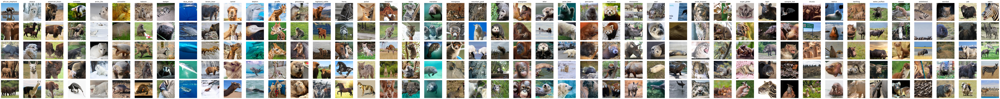

In [6]:
def visualize_samples(data_dir, num_samples=5):
    fig, axes = plt.subplots(num_samples, len(os.listdir(data_dir)), figsize=(100, num_samples * 2))
    for i, species in enumerate(os.listdir(data_dir)):
        species_dir = os.path.join(data_dir, species)
        sample_images = os.listdir(species_dir)[:num_samples]
        for j, img in enumerate(sample_images):
            img_path = os.path.join(species_dir, img)
            img = plt.imread(img_path)
            axes[j, i].imshow(img)
            axes[j, i].axis('off')
            if j == 0:
                axes[j, i].set_title(species)
    plt.tight_layout()
    plt.show()

visualize_samples(data_dir)


## Normalize and resize images

In [12]:

# Image dimensions
img_height, img_width = 180, 180

datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2) # 20% for validation

train_generator = datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    subset='training') # set as training data

validation_generator = datagen.flow_from_directory(
   data_dir,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    subset='validation') # set as validation data



Found 11020 images belonging to 45 classes.
Found 2731 images belonging to 45 classes.


## Train data

In [10]:
names_train = list(train_generator.class_indices.keys())
print(names_train)

['african_elephant', 'alpaca', 'american_bison', 'anteater', 'arctic_fox', 'armadillo', 'baboon', 'badger', 'blue_whale', 'brown_bear', 'camel', 'dolphin', 'giraffe', 'groundhog', 'highland_cattle', 'horse', 'jackal', 'kangaroo', 'koala', 'manatee', 'mongoose', 'mountain_goat', 'opossum', 'orangutan', 'otter', 'polar_bear', 'porcupine', 'red_panda', 'rhinoceros', 'sea_lion', 'seal', 'snow_leopard', 'squirrel', 'sugar_glider', 'tapir', 'vampire_bat', 'vicuna', 'walrus', 'warthog', 'water_buffalo', 'weasel', 'wildebeest', 'wombat', 'yak', 'zebra']


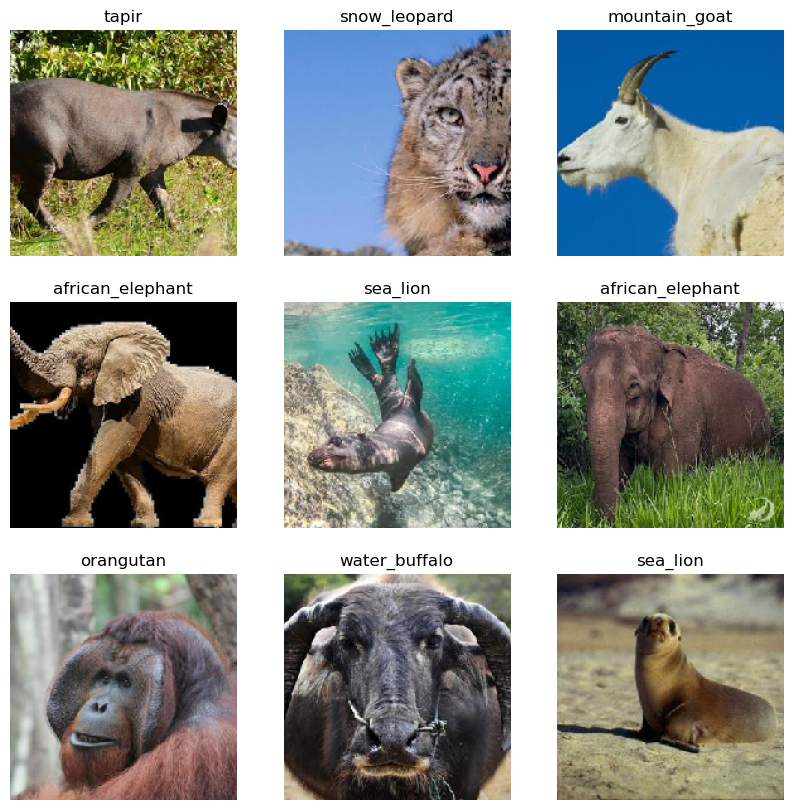

In [14]:
# Here are some images of training data.
import matplotlib.pyplot as plt

# Set the number of images you want to display
num_images = 9

# Get a batch of images and labels from the train_generator
for images, labels in train_generator:
    break  # Break after the first batch

# Create a figure to display the images
plt.figure(figsize=(10, 10))
for i in range(num_images):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    class_idx = tf.argmax(labels[i])
    class_name = class_names[class_idx]  # Assuming you have class_names defined
    plt.title(class_name)
    plt.axis("off")

plt.show()


### CNN model

In [29]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Image dimensions
img_height, img_width = 150, 150

# Define the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(45, activation='softmax')  # 45 units for 45 classes
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
epochs = 10  # You can adjust the number of epochs
history_c = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)


Epoch 1/10
344/344 [==============================] - 480s 1s/step - loss: 3.5245 - accuracy: 0.0868 - val_loss: 3.1176 - val_accuracy: 0.1915
Epoch 2/10
344/344 [==============================] - 334s 970ms/step - loss: 3.0192 - accuracy: 0.1948 - val_loss: 2.7858 - val_accuracy: 0.2724
Epoch 3/10
344/344 [==============================] - 306s 889ms/step - loss: 2.6490 - accuracy: 0.2842 - val_loss: 2.6404 - val_accuracy: 0.3011
Epoch 4/10
344/344 [==============================] - 308s 894ms/step - loss: 2.2097 - accuracy: 0.3882 - val_loss: 2.6001 - val_accuracy: 0.3143
Epoch 5/10
344/344 [==============================] - 294s 856ms/step - loss: 1.7319 - accuracy: 0.5086 - val_loss: 2.7093 - val_accuracy: 0.3316
Epoch 6/10
344/344 [==============================] - 280s 814ms/step - loss: 1.2302 - accuracy: 0.6440 - val_loss: 2.8174 - val_accuracy: 0.3335
Epoch 7/10
344/344 [==============================] - 251s 728ms/step - loss: 0.8608 - accuracy: 0.7472 - val_loss: 3.1373 - va

###### Conclusion:
The accuracy on the training data improves over epochs, reaching a high value. However, the validation accuracy also increases initially but then appears to plateau or decrease slightly. This behavior suggests that the model is overfitting after a certain number of epochs. Overfitting occurs when the model becomes too specialized in the training data and does not generalize well to unseen data.


### Transfer Learning model

In [17]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Input

# Define VGG16 model with pre-trained weights
vgg_model = VGG16(weights='imagenet', include_top=False, input_tensor=Input(shape=(150, 150, 3)))

# Freeze all layers in the VGG16 model
for layer in vgg_model.layers:
    layer.trainable = False

# Create a Sequential model that includes the VGG16 base
transfer_model = tf.keras.Sequential([
    vgg_model,
    tf.keras.layers.GlobalAveragePooling2D(),  # Change to Global Average Pooling
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(45, activation='softmax')  # Adjust the output units based on your dataset
])

# Compile the model
transfer_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model using your generators
epochs = 10  # You can adjust the number of epochs
history = transfer_model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)



Epoch 1/10
344/344 [==============================] - 3340s 10s/step - loss: 3.0661 - accuracy: 0.2587 - val_loss: 2.4050 - val_accuracy: 0.4037
Epoch 2/10
344/344 [==============================] - 2976s 9s/step - loss: 2.0845 - accuracy: 0.4678 - val_loss: 1.8861 - val_accuracy: 0.5040
Epoch 3/10
344/344 [==============================] - 23235s 68s/step - loss: 1.7008 - accuracy: 0.5544 - val_loss: 1.6413 - val_accuracy: 0.5651
Epoch 4/10
344/344 [==============================] - 7497s 22s/step - loss: 1.4839 - accuracy: 0.6025 - val_loss: 1.5192 - val_accuracy: 0.5871
Epoch 5/10
344/344 [==============================] - 1744s 5s/step - loss: 1.3508 - accuracy: 0.6346 - val_loss: 1.4325 - val_accuracy: 0.6011
Epoch 6/10
344/344 [==============================] - 2350s 7s/step - loss: 1.2490 - accuracy: 0.6545 - val_loss: 1.3832 - val_accuracy: 0.6085
Epoch 7/10
344/344 [==============================] - 2081s 6s/step - loss: 1.1668 - accuracy: 0.6768 - val_loss: 1.3056 - val_accur

###### Conclusion:
The accuracy on the training data improves over epochs, reaching a high value. Similarly, the validation accuracy also increases, which is a positive sign. The fact that the validation accuracy is increasing along with the training accuracy suggests that the model is learning to generalize well to unseen data.

#### Inference:
The validation accuracy is in the range of 63% to 64% after 10 epochs. This suggests that the model is learning to recognize patterns in the data and is performing reasonably well. It's not overfitting the training data, as both training and validation accuracies are close.

### Training and Validation plot of Transfer Learning Model

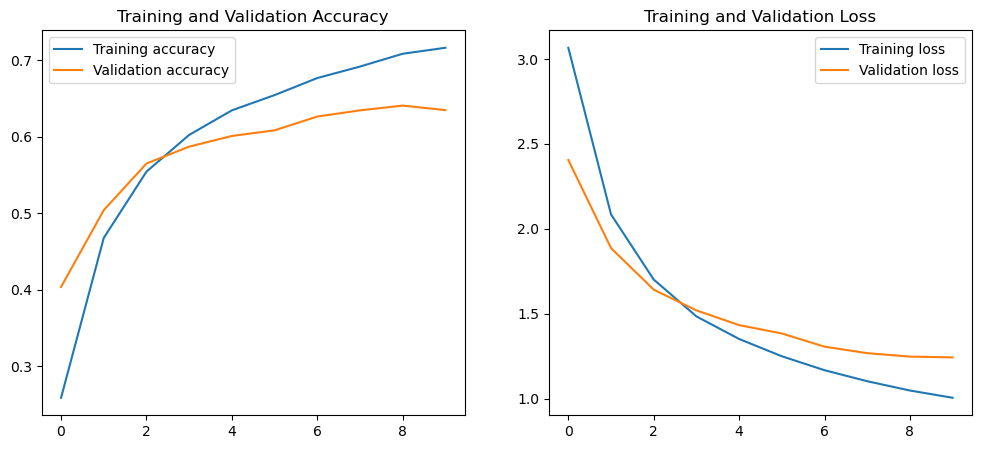

In [26]:
import matplotlib.pyplot as plt

# Assuming you have already trained your transfer_model and stored the history in the 'history' variable.

acc = history.history["accuracy"]
loss = history.history['loss']
val_acc = history.history["val_accuracy"]
val_loss = history.history['val_loss']

# Accuracy for training and validation
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(len(acc)), acc, label="Training accuracy")
plt.plot(range(len(val_acc)), val_acc, label="Validation accuracy")
plt.legend()
plt.title("Training and Validation Accuracy")

# Loss for validation and training
plt.subplot(1, 2, 2)
plt.plot(range(len(loss)), loss, label="Training loss")
plt.plot(range(len(val_loss)), val_loss, label="Validation loss")
plt.legend()
plt.title("Training and Validation Loss")

plt.show()


## User interface developmemt